In [ ]:
#This code is to understand the entire pipeline. 
#Emphasis is on how the problem is to be analysed, rather than core ML concepts. 

In [2]:
import numpy as np
import pandas as pd 


import os
print(os.listdir("inputs"))

['diabetes.csv']


In [3]:
#Aim - predict onset of diabetes, so classification then with 1(diabetes is going to occur) and 0(not diabetic)?
#lets

import sys
import os
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import display
%matplotlib inline

import plotly.offline as py
import plotly.graph_objs as go
import plotly.tools as tls
py.init_notebook_mode(connected=True)

import warnings
warnings.filterwarnings('ignore')




In [4]:
#What is this?
SEED = 7
np.random.seed(SEED)


In [5]:
#Prepare the data with pandas data-frame

df = pd.read_csv('inputs/diabetes.csv')
df_name = df.columns

In [6]:
#Lets have a look at the data
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Pregnancies               768 non-null    int64  
 1   Glucose                   768 non-null    int64  
 2   BloodPressure             768 non-null    int64  
 3   SkinThickness             768 non-null    int64  
 4   Insulin                   768 non-null    int64  
 5   BMI                       768 non-null    float64
 6   DiabetesPedigreeFunction  768 non-null    float64
 7   Age                       768 non-null    int64  
 8   Outcome                   768 non-null    int64  
dtypes: float64(2), int64(7)
memory usage: 54.1 KB


In [7]:
df.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1


In [8]:
df.describe()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
count,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000
mean,3.845052,120.894531,69.105469,20.536458,79.799479,31.992578,0.471876,33.240885,0.348958
std,3.369578,31.972618,19.355807,15.952218,115.244002,7.884160,0.331329,11.760232,0.476951
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.078000,21.000000,0.000000
25%,1.000000,99.000000,62.000000,0.000000,0.000000,27.300000,0.243750,24.000000,0.000000
50%,3.000000,117.000000,72.000000,23.000000,30.500000,32.000000,0.372500,29.000000,0.000000
75%,6.000000,140.250000,80.000000,32.000000,127.250000,36.600000,0.626250,41.000000,1.000000
max,17.000000,199.000000,122.000000,99.000000,846.000000,67.100000,2.420000,81.000000,1.000000


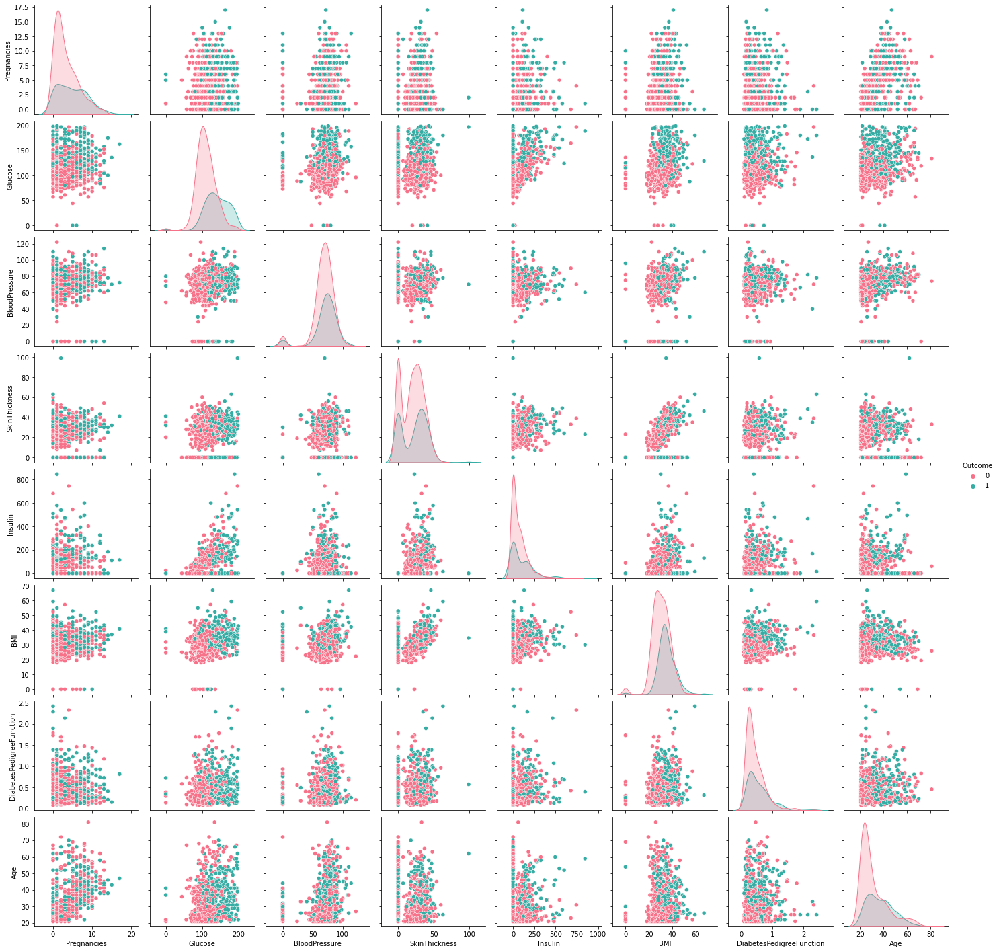

In [9]:
#Now lets get a closer look

g = sns.pairplot(df, hue = "Outcome", palette="husl")

<AxesSubplot:>

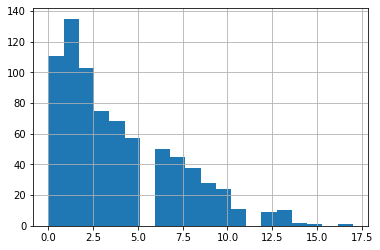

In [10]:
#Pairplot tells us some things about how each of the variable is dependent on the other. 
#Can also see some outliers based on this plt

#Lets plot histogram for one of the features
#Source code has a function to do this
#Why use many words when few do trick?

df['Pregnancies'].hist(bins = 20)
#hist = df.hist(bins=30)

In [11]:
#This doesnt tell us much tbh
#For each variable we can look at the skewness and the kurtosis
#skewness - measure of lack of symmetry
#kurtosis - measure of being heavy tailed relative to a normal distribution
#whatever that means, need to look it up later
#Apart from those two params, we also try to plot histogram of every feature as a function of the output, two traces(for outputs - 1 and 0)
py.init_notebook_mode()
from scipy.stats import skew
from scipy.stats import kurtosis
def plotBarCat(df, feature, target):
    
    x0 = df[df[target]==0][feature]
    x1 = df[df[target]==1][feature]
    
    trace1 = go.Histogram(
        x=x0,
        opacity=0.75
    )
    trace2 = go.Histogram(
        x=x1,
        opacity = 0.75
    )
    
    data = [trace1, trace2]
    layout = go.Layout(barmode='overlay',
                      title=feature,
                      yaxis=dict(title='Count'))
    
    fig = go.Figure(data=data, layout = layout)
    py.iplot(fig, filename='overlaid histogram')
    print('-o*o-'*25)
    print("{0} mean :".format(target), np.mean(df[target]))
    print("{0} var :".format(target), np.var(df[target]))
    print("{0} skew :".format(target), skew(df[target]))
    print("{0} kurt :".format(target), kurtosis(df[target]))
    print('-o*o-'*25)
    



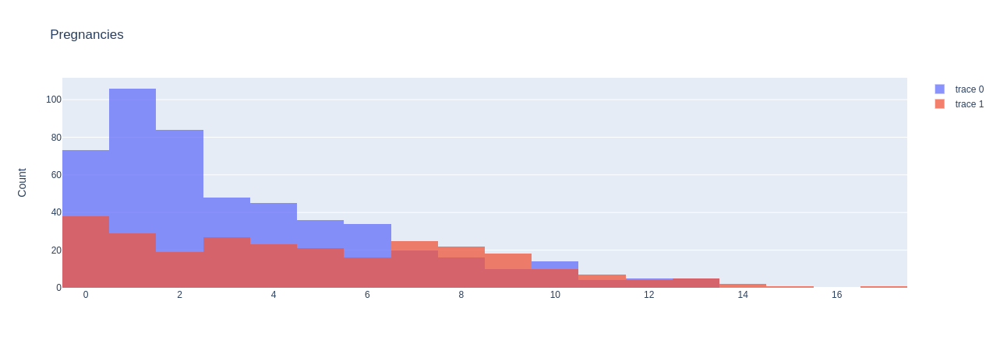

-o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o-
Outcome mean : 0.3489583333333333
Outcome var : 0.22718641493055558
Outcome skew : 0.6337757030614577
Outcome kurt : -1.5983283582089547
-o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o-


In [12]:


plotBarCat(df,df_name[0],'Outcome')



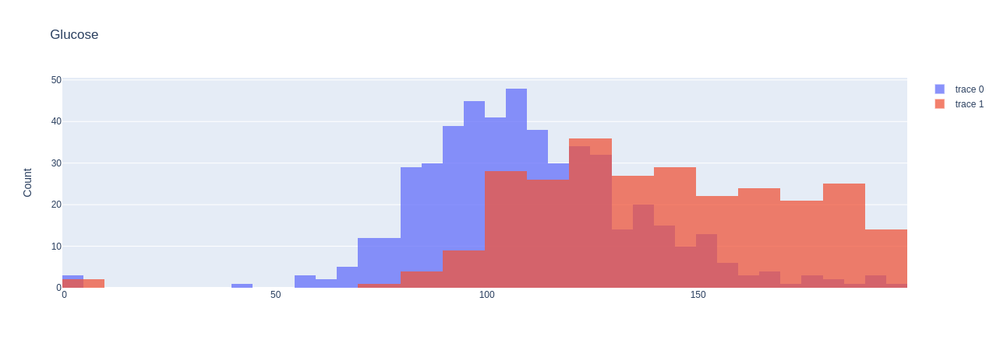

-o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o-
Outcome mean : 0.3489583333333333
Outcome var : 0.22718641493055558
Outcome skew : 0.6337757030614577
Outcome kurt : -1.5983283582089547
-o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o-


In [13]:
#Lets do this for each of the feature keeping in mind high kurtosis means heavy tails, i.e outliers.
plotBarCat(df,df_name[1],'Outcome')

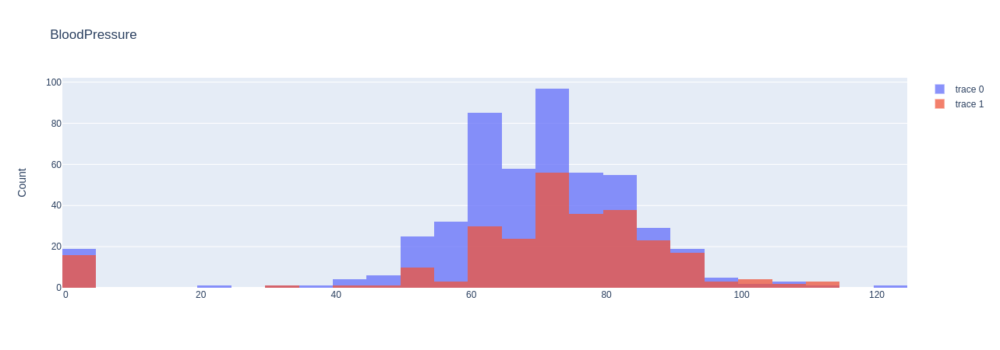

-o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o-
Outcome mean : 0.3489583333333333
Outcome var : 0.22718641493055558
Outcome skew : 0.6337757030614577
Outcome kurt : -1.5983283582089547
-o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o-


In [14]:
plotBarCat(df,df_name[2],'Outcome')


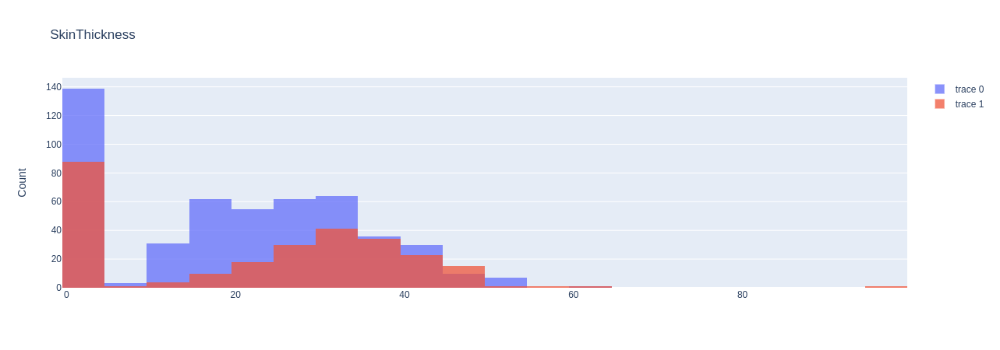

-o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o-
Outcome mean : 0.3489583333333333
Outcome var : 0.22718641493055558
Outcome skew : 0.6337757030614577
Outcome kurt : -1.5983283582089547
-o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o-


In [15]:
#BP of 0? I mean you dont have diabetes, at that point you just dead. 
#But why is kurt value negative here?
plotBarCat(df,df_name[3],'Outcome')



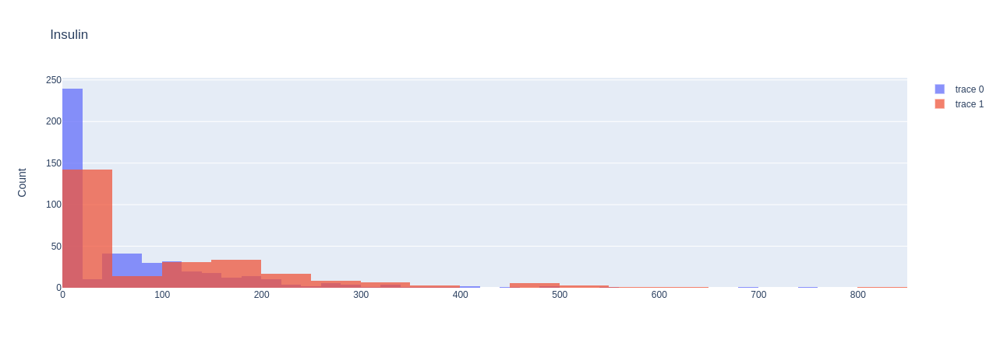

-o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o-
Outcome mean : 0.3489583333333333
Outcome var : 0.22718641493055558
Outcome skew : 0.6337757030614577
Outcome kurt : -1.5983283582089547
-o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o-


In [16]:
#Pachydermatous outlier
plotBarCat(df,df_name[4],'Outcome')



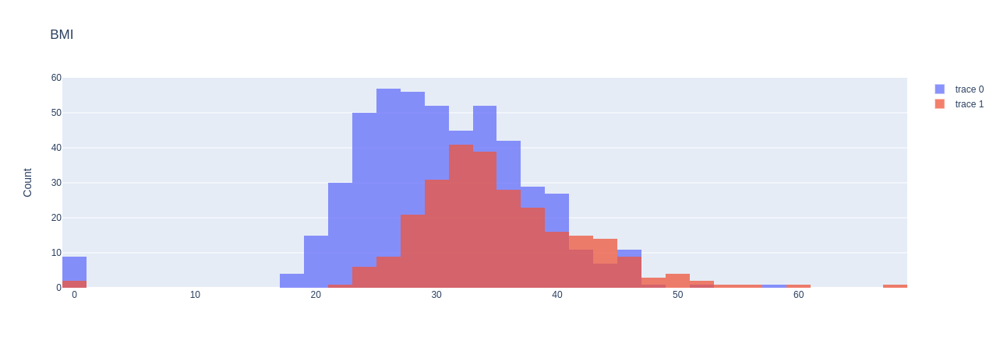

-o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o-
Outcome mean : 0.3489583333333333
Outcome var : 0.22718641493055558
Outcome skew : 0.6337757030614577
Outcome kurt : -1.5983283582089547
-o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o-


In [17]:
plotBarCat(df,df_name[5],'Outcome')



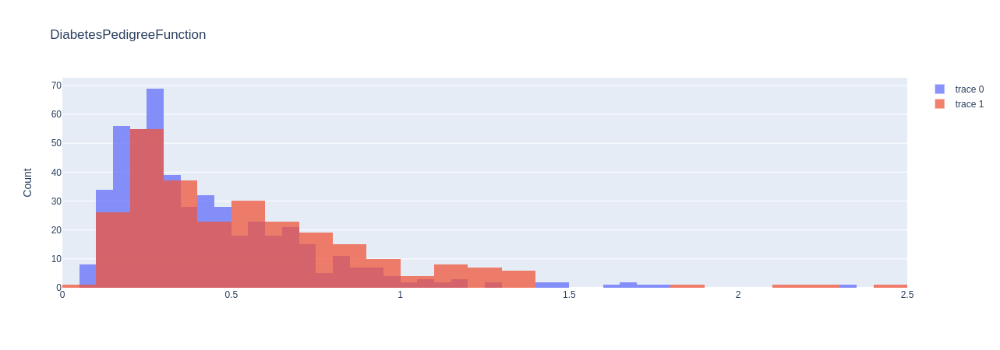

-o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o-
Outcome mean : 0.3489583333333333
Outcome var : 0.22718641493055558
Outcome skew : 0.6337757030614577
Outcome kurt : -1.5983283582089547
-o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o-


In [18]:
plotBarCat(df,df_name[6],'Outcome')



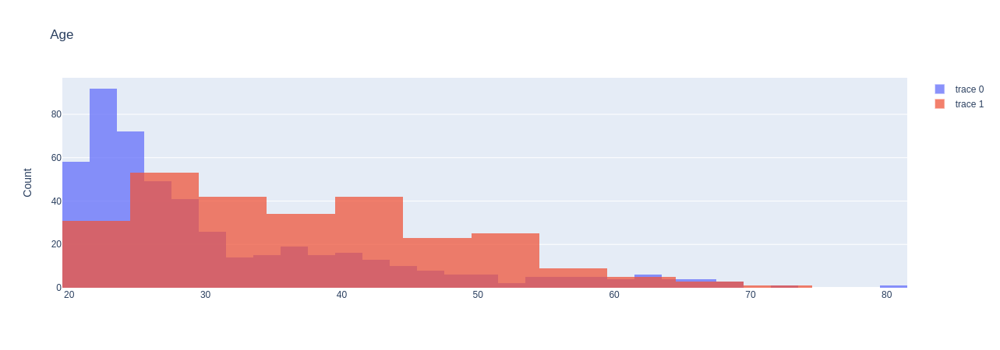

-o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o-
Outcome mean : 0.3489583333333333
Outcome var : 0.22718641493055558
Outcome skew : 0.6337757030614577
Outcome kurt : -1.5983283582089547
-o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o-


In [19]:
plotBarCat(df,df_name[7],'Outcome')



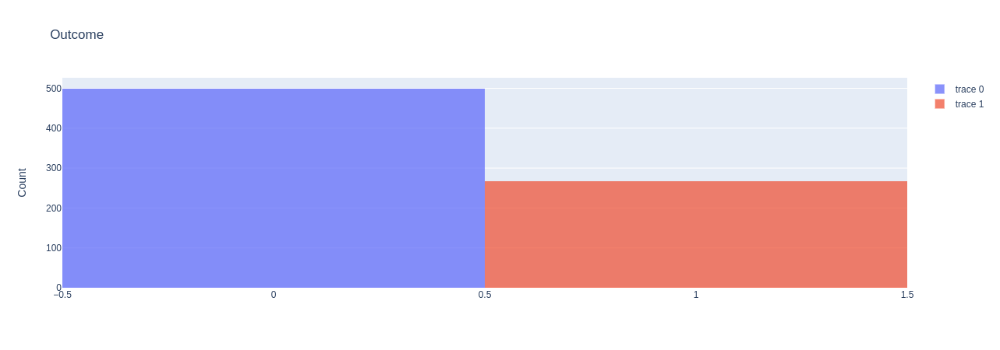

-o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o-
Outcome mean : 0.3489583333333333
Outcome var : 0.22718641493055558
Outcome skew : 0.6337757030614577
Outcome kurt : -1.5983283582089547
-o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o--o*o-


In [20]:
plotBarCat(df,df_name[8],'Outcome')


In [21]:
#This step is to see if our data is unbalanced. 500:268, not bad. No need to resample. 
#Now lets use box plots to understand the outliers for each feature.
#Box plots are used to better understand how values are spaced out in different sets of data.


def OutLiersBox(df, nameofFeature):
   
    trace0 = go.Box(
    y =  df[nameofFeature],
    name = "All Points",
    jitter = 0.3,
    pointpos = -1.8,
    boxpoints = 'all',
    marker = dict(
        color = 'rgb(7, 38, 91)'),
    line = dict(
        color = 'rgb(7, 38, 91)')
    )
    
    trace1 = go.Box(
    y =  df[nameofFeature],
    name = "Only Whiskers",
    boxpoints = False,
    marker = dict(
        color = 'rgb(9, 54, 127)'),
    line = dict(
        color = 'rgb(9, 54, 125)')
    )
    
    trace2 = go.Box(
    y =  df[nameofFeature],
    name = "Suspected Outliers",
    boxpoints = 'suspectedoutliers',
    marker = dict(
        color = 'rgb(9, 54, 127)',
        line = dict(
            outliercolor = 'rgba(219, 64, 80, 0.6)',
            outlierwidth = 2)),
    line = dict(
        color = 'rgb(8, 79, 156)')
    )
    
    trace3 = go.Box(
    y =  df[nameofFeature],
    name = "Whiskers and Outliers",
    boxpoints = 'outliers',
    marker = dict(
        color = 'rgb(105, 172, 212)'),
    line = dict(
        color = 'rgb(105, 172, 212)')
    )
    
    data = [trace0, trace1, trace2, trace3]
    
    layout = go.Layout(
        title = "{} Outliers".format(nameofFeature))
    
    fig = go.Figure(data=data, layout=layout)
    py.iplot(fig, filename = "Outliers")
    
        
    

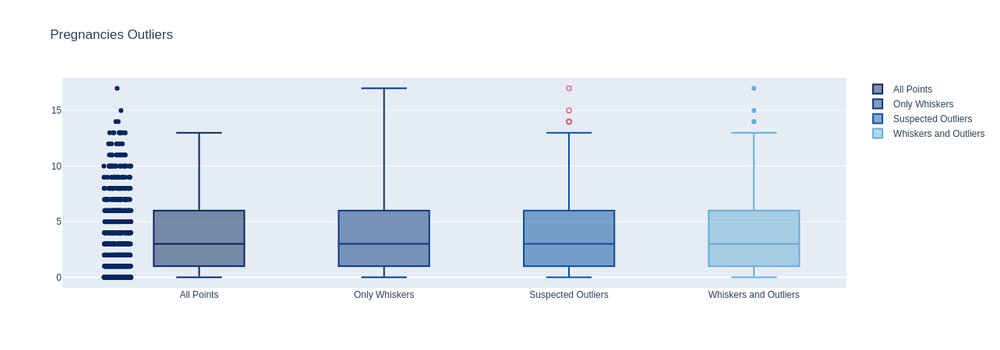

In [22]:
OutLiersBox(df, df_name[0])
#Lines are at Q1, the median and Q3
#We need to compare the box plot with all other features to get some inference

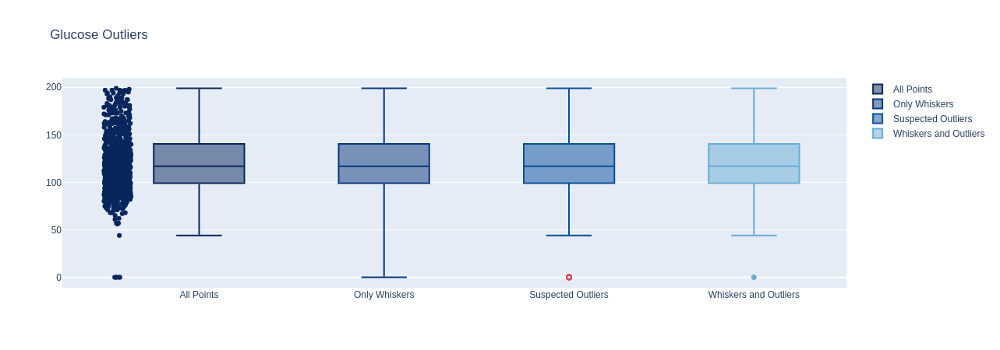

In [23]:
OutLiersBox(df, df_name[1])


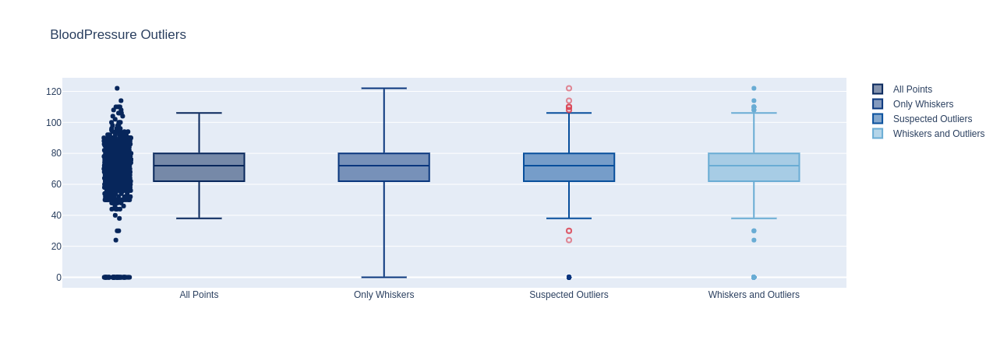

In [24]:
OutLiersBox(df, df_name[2])


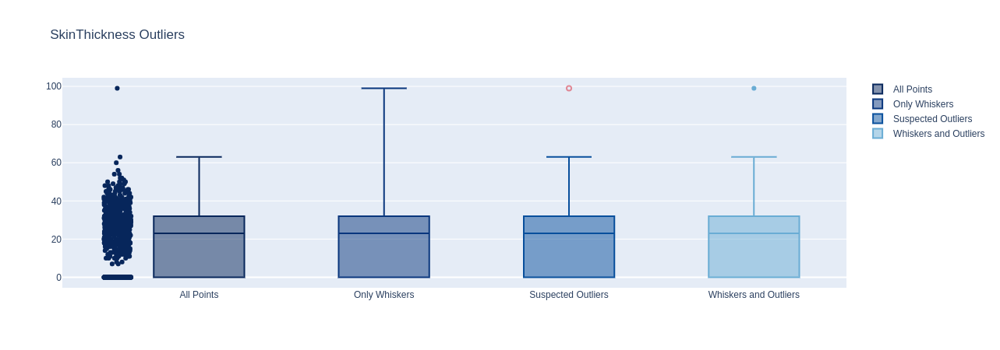

In [25]:
OutLiersBox(df, df_name[3])


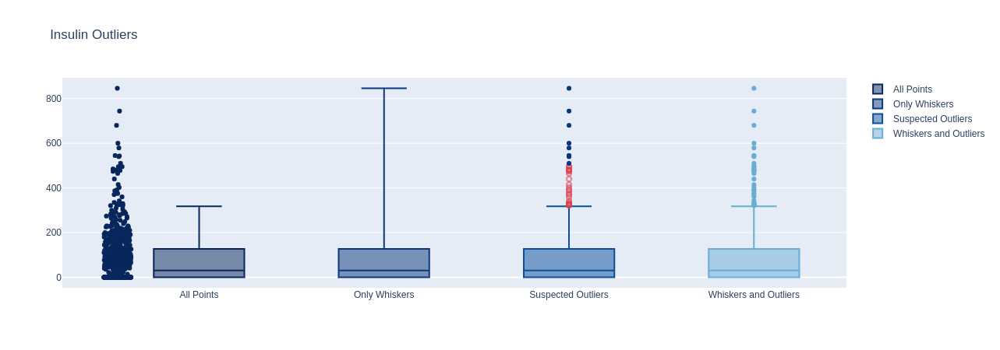

In [26]:
#Shouldnt 0 skin thickness also be a outlier?
OutLiersBox(df, df_name[4])


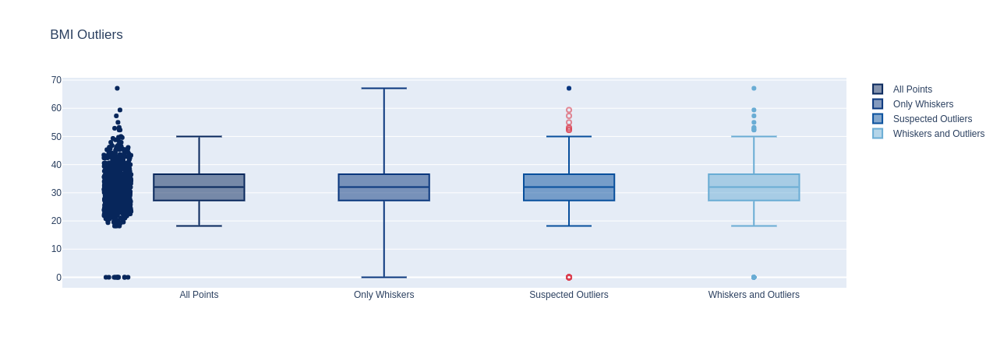

In [27]:
OutLiersBox(df, df_name[5])


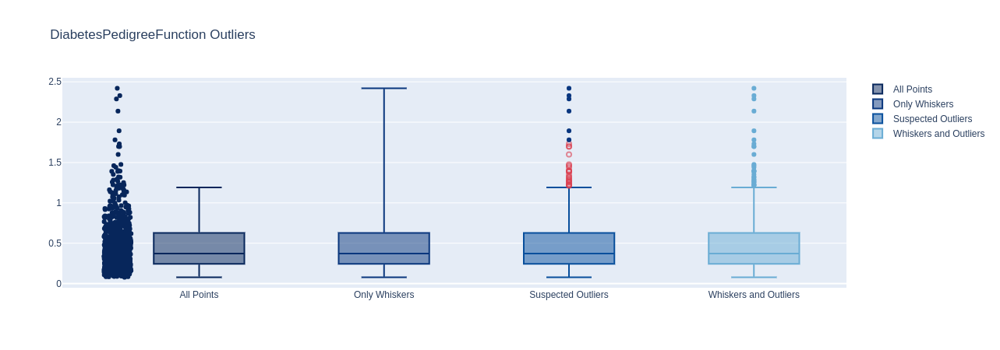

In [28]:
OutLiersBox(df, df_name[6])


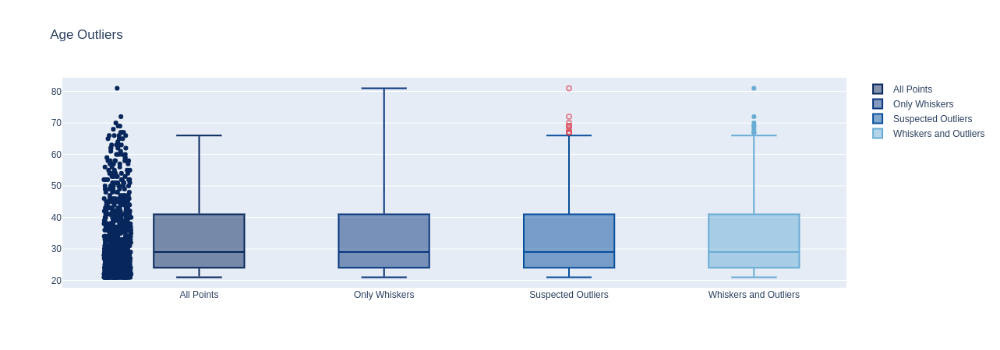

In [29]:
OutLiersBox(df, df_name[7])


In [30]:
#Investigate how each algo handles the outliers?
#See that each box just tells you the possible outliers, I feel that skin thickness of 0 missed out. 

In [31]:
#Those were suspected outliers, here we use 4 different algos to find the outliers - one class SVMs, robust covariance, islotion forests and local outlier factor
#Read up on all 4 algos separatly. 
#Check - https://scikit-learn.org/stable/modules/outlier_detection.html


from scipy import stats
import matplotlib.pyplot as plt
import matplotlib.font_manager

from sklearn import svm
from sklearn.covariance import EllipticEnvelope
from sklearn.ensemble import IsolationForest
from sklearn.neighbors import LocalOutlierFactor

def OutLierDetection(df, feature1, feature2, outliers_fraction=0.1):
        
        new_df = df.copy()
        rng = np.random.RandomState(42)
        
        n_samples = new_df.shape[0]
        clusters_separation = [0]
        #Try diff values for this and the fraction?
        
        classifiers = {
            "One-Class SVM" : svm.OneClassSVM(nu=0.95 * outliers_fraction + 0.05,
                                             kernel = "rbf", gamma=0.1),
            "Robust covariance" : EllipticEnvelope(contamination=outliers_fraction),
            "Isolation Forest" : IsolationForest(max_samples = n_samples,
                                                contamination = outliers_fraction,
                                                random_state = rng),
            "Local Outlier Factor" : LocalOutlierFactor(
                n_neighbors = 35,
                contamination = outliers_fraction)}
        
        xx, yy = np.meshgrid(np.linspace(new_df[feature1].min()-new_df[feature1].min()*10/100, 
                                     new_df[feature1].max()+new_df[feature1].max()*10/100, 50),
                         np.linspace(new_df[feature2].min()-new_df[feature2].min()*10/100,
                                     new_df[feature2].max()+new_df[feature2].max()*10/100, 50))
        n_inliers = int((1 - outliers_fraction) * n_samples)
        n_outliers = int(outliers_fraction * n_samples)
        ground_truth = np.ones(n_samples, dtype=int)
        ground_truth[-n_outliers:] = -1
        
        # Lets make clusters of data that matters 
        
        for i, offset in enumerate(clusters_separation):
            np.random.seed(42)
            
            X = new_df[[feature1, feature2]].values.tolist()
            
            #Fit the model 
            plt.figure(figsize=(8,7))
            for i, (clf_name, clf) in enumerate(classifiers.items()):
                #Fit data and tag the  outliers
                if clf_name == "Local Outlier Factor":
                    y_pred = clf.fit_predict(X)
                    scores_pred = clf.negative_outlier_factor_
                else : 
                    clf.fit(X)
                    scores_pred = clf.decision_function(X)
                    y_pred = clf.predict(X)
                threshold = stats.scoreatpercentile(scores_pred, 100 * outliers_fraction)
                n_errors = (y_pred != ground_truth).sum()
                
                unique, counts = np.unique(y_pred,return_counts=True)
                print(clf_name, dict(zip(unique, counts)))
                
                new_df[feature1+'_'+feature2+clf_name] = y_pred
                
                #Plotting the level lines and contours
                
                if clf_name == "Local Outlier Factor" :
                    Z = clf._decision_function(np.c_[xx.ravel(), yy.ravel()])
                else:
                    Z = clf.decision_function(np.c_[xx.ravel(), yy.ravel()])
                #Look what private functions mean
                Z = Z.reshape(xx.shape)
                subplot = plt.subplot(2, 2, i+1)
                subplot.contourf(xx, yy, Z, levels = np.linspace(Z.min(), threshold, 7), 
                                cmap = plt.cm.Blues_r)
                a = subplot.contour(xx, yy, Z, levels=[threshold], linewidths = 2, colors='red')
                subplot.contourf(xx, yy, Z, levels = [threshold, Z.max()], colors = 'orange')
                b = subplot.scatter(new_df[feature1], new_df[feature2], c='white', s=20, edgecolor='k')
                
                subplot.axis('tight')
                
                subplot.set_xlabel("%s" % (feature1))
                
                plt.ylabel(feature2)
                plt.title("%d. %s (errors: %d)" % (i+1, clf_name, n_errors))
                
            plt.subplots_adjust(0.04, 0.1, 0.96, 0.94, 0.1, 0.26)
            
        plt.show()
        return new_df
                

                
                

One-Class SVM {-1: 197, 1: 571}
Robust covariance {-1: 77, 1: 691}
Isolation Forest {-1: 77, 1: 691}
Local Outlier Factor {-1: 76, 1: 692}


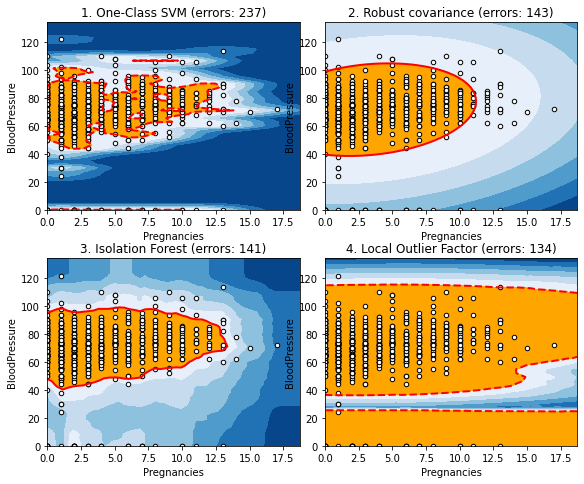

In [32]:
tt = OutLierDetection(df, 'Pregnancies', 'BloodPressure', 0.1)

In [33]:
##For now lets leave outliers here. We will return to see how our machine performs if they are removed later. 
#Data is split into test, val, and train. Test and val is used to fine-tune. Test is used only finally. Use k-fold to reduce variance. 
#Lets first load all the models

# Load libraries

from pandas import set_option
from pandas.plotting import scatter_matrix
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import ExtraTreesClassifier




    


In [34]:
#Lets split into train-val set and test set

X = df[df_name[0:8]]
Y = df[df_name[8]]
X_train, X_test, y_train, y_test = train_test_split(X,Y,test_size = 0.25, random_state = 0, stratify = df['Outcome'])

In [35]:
#Our prototype or first model results 

def GetWokeModel():
    basedModels = []
    basedModels.append(('LR'   , LogisticRegression()))
    basedModels.append(('LDA'  , LinearDiscriminantAnalysis()))
    basedModels.append(('KNN'  , KNeighborsClassifier()))
    basedModels.append(('CART' , DecisionTreeClassifier()))
    basedModels.append(('NB'   , GaussianNB()))
    basedModels.append(('SVM'  , SVC(probability=True)))
    basedModels.append(('AB'   , AdaBoostClassifier()))
    basedModels.append(('GBM'  , GradientBoostingClassifier()))
    basedModels.append(('RF'   , RandomForestClassifier()))
    basedModels.append(('ET'   , ExtraTreesClassifier()))
    
    return basedModels

In [36]:
def BasedLine(X_train, y_train, models):
    
    num_folds = 10
    scoring = 'accuracy'
    
    results = []
    names = []
    for name, model in models:
        kfold = StratifiedKFold(n_splits = num_folds, random_state = SEED)
        cv_results = cross_val_score(model, X_train, y_train, cv = kfold, scoring = scoring )
        results.append(cv_results)
        names.append(name)
        
        msg = "%s: %f mean result with std dev %f" % (name, cv_results.mean(), cv_results.std())
        print (msg)
        
    return  names, results



In [37]:
class PlotBoxR(object):
    
    
    def __Trace(self,nameOfFeature,value): 
    
        trace = go.Box(
            y=value,
            name = nameOfFeature,
            marker = dict(
                color = 'rgb(0, 128, 128)',
            )
        )
        return trace

    def PlotResult(self,names,results):
        
        data = []

        for i in range(len(names)):
            data.append(self.__Trace(names[i],results[i]))


        py.iplot(data)

LR: 0.756897 mean result with std dev 0.036000
LDA: 0.760405 mean result with std dev 0.033932
KNN: 0.698004 mean result with std dev 0.046531
CART: 0.694404 mean result with std dev 0.040603
NB: 0.743103 mean result with std dev 0.036788
SVM: 0.743134 mean result with std dev 0.041095
AB: 0.755233 mean result with std dev 0.054116
GBM: 0.753600 mean result with std dev 0.032727
RF: 0.731034 mean result with std dev 0.037927
ET: 0.741289 mean result with std dev 0.039284


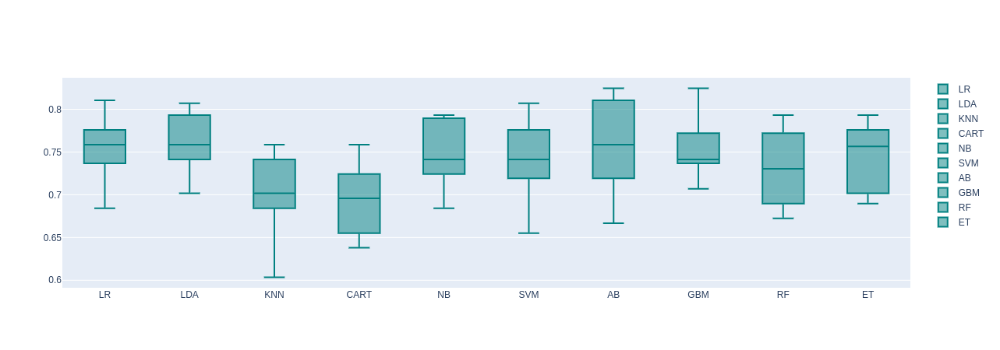

In [38]:
models = GetWokeModel()
names, results = BasedLine(X_train, y_train, models)
PlotBoxR().PlotResult(names,results)

In [39]:
def ScoreDataFrame(names,results):
    def floatingDecimals(f_val, dec=3):
        prc = "{:."+str(dec)+"f}"
        
        return float(prc.format(f_val))
    
    scores = []
    for r in results:
        scores.append(floatingDecimals(r.mean(),4))
        
    scoreDataFrame = pd.DataFrame({'Model':names, 'Score':scores})
    return scoreDataFrame


#Preprocessing data -  Shouldnt have this been done earlier
#Two ways to do it - standardize to 0 mean and unit variance,
#Minmax 
#what is difference bw standardscalar and normalizer?
#Lets first see the score before normalizing


In [40]:
Prototype_score = ScoreDataFrame(names, results)
Prototype_score

,Model,Score
0,LR,0.7569
1,LDA,0.7604
2,KNN,0.6980
3,CART,0.6944
4,NB,0.7431
5,SVM,0.7431
6,AB,0.7552
7,GBM,0.7536
8,RF,0.7310
9,ET,0.7413


In [41]:
#WE have a winner ladies and gents
#Now observe as the scores should change on normalizing - 

from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler 

def GetScaledModel(nameOfScaler):
    
    if nameOfScaler == 'standard':
        scaler = StandardScaler()
    elif nameOfScaler =='minmax':
        scaler = MinMaxScaler()

    pipelines = []
    pipelines.append((nameOfScaler+'LR'  , Pipeline([('Scaler', scaler),('LR'  , LogisticRegression())])))
    pipelines.append((nameOfScaler+'LDA' , Pipeline([('Scaler', scaler),('LDA' , LinearDiscriminantAnalysis())])))
    pipelines.append((nameOfScaler+'KNN' , Pipeline([('Scaler', scaler),('KNN' , KNeighborsClassifier())])))
    pipelines.append((nameOfScaler+'CART', Pipeline([('Scaler', scaler),('CART', DecisionTreeClassifier())])))
    pipelines.append((nameOfScaler+'NB'  , Pipeline([('Scaler', scaler),('NB'  , GaussianNB())])))
    pipelines.append((nameOfScaler+'SVM' , Pipeline([('Scaler', scaler),('SVM' , SVC())])))
    pipelines.append((nameOfScaler+'AB'  , Pipeline([('Scaler', scaler),('AB'  , AdaBoostClassifier())])  ))
    pipelines.append((nameOfScaler+'GBM' , Pipeline([('Scaler', scaler),('GMB' , GradientBoostingClassifier())])  ))
    pipelines.append((nameOfScaler+'RF'  , Pipeline([('Scaler', scaler),('RF'  , RandomForestClassifier())])  ))
    pipelines.append((nameOfScaler+'ET'  , Pipeline([('Scaler', scaler),('ET'  , ExtraTreesClassifier())])  ))


    return pipelines 

standardLR: 0.762160 mean result with std dev 0.031231
standardLDA: 0.760405 mean result with std dev 0.033932
standardKNN: 0.713612 mean result with std dev 0.050130
standardCART: 0.706443 mean result with std dev 0.037992
standardNB: 0.743103 mean result with std dev 0.036788
standardSVM: 0.755172 mean result with std dev 0.025333
standardAB: 0.755233 mean result with std dev 0.054116
standardGBM: 0.750091 mean result with std dev 0.032454
standardRF: 0.748397 mean result with std dev 0.041818
standardET: 0.743073 mean result with std dev 0.024054


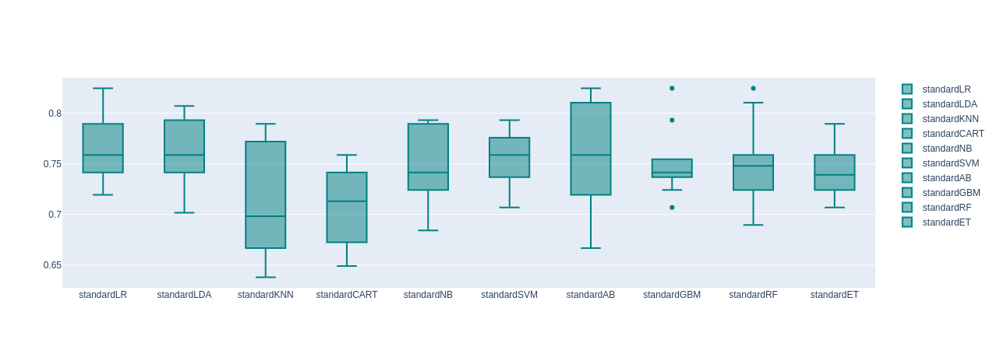

,Model,Score,Model,Score
0,LR,0.7569,standardLR,0.7622
1,LDA,0.7604,standardLDA,0.7604
2,KNN,0.6980,standardKNN,0.7136
3,CART,0.6944,standardCART,0.7064
4,NB,0.7431,standardNB,0.7431
5,SVM,0.7431,standardSVM,0.7552
6,AB,0.7552,standardAB,0.7552
7,GBM,0.7536,standardGBM,0.7501
8,RF,0.7310,standardRF,0.7484
9,ET,0.7413,standardET,0.7431


In [42]:
#Ideally trees do not depend on scaling, let us see if that is the case here - 

models = GetScaledModel('standard')
names,results = BasedLine(X_train, y_train,models)
PlotBoxR().PlotResult(names,results)
scaledScoreStandard = ScoreDataFrame(names,results)
compareModels = pd.concat([Prototype_score,
                           scaledScoreStandard], axis=1)
compareModels



minmaxLR: 0.762129 mean result with std dev 0.030495
minmaxLDA: 0.760405 mean result with std dev 0.033932
minmaxKNN: 0.713612 mean result with std dev 0.049576
minmaxCART: 0.696189 mean result with std dev 0.039556
minmaxNB: 0.743103 mean result with std dev 0.036788
minmaxSVM: 0.770901 mean result with std dev 0.031363
minmaxAB: 0.755233 mean result with std dev 0.054116
minmaxGBM: 0.757048 mean result with std dev 0.031223
minmaxRF: 0.750060 mean result with std dev 0.035134
minmaxET: 0.746612 mean result with std dev 0.036073


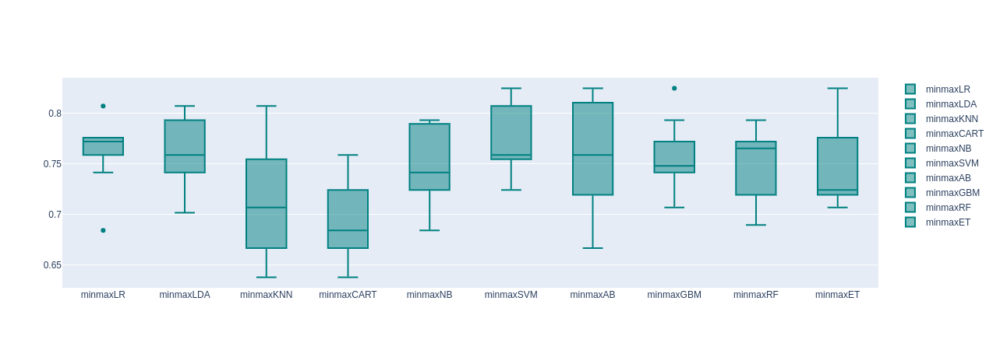

,Model,Score,Model,Score,Model,Score
0,LR,0.7569,standardLR,0.7622,minmaxLR,0.7621
1,LDA,0.7604,standardLDA,0.7604,minmaxLDA,0.7604
2,KNN,0.6980,standardKNN,0.7136,minmaxKNN,0.7136
3,CART,0.6944,standardCART,0.7064,minmaxCART,0.6962
4,NB,0.7431,standardNB,0.7431,minmaxNB,0.7431
5,SVM,0.7431,standardSVM,0.7552,minmaxSVM,0.7709
6,AB,0.7552,standardAB,0.7552,minmaxAB,0.7552
7,GBM,0.7536,standardGBM,0.7501,minmaxGBM,0.7570
8,RF,0.7310,standardRF,0.7484,minmaxRF,0.7501
9,ET,0.7413,standardET,0.7431,minmaxET,0.7466


In [43]:
#Now what if we use min max instead?


models = GetScaledModel('minmax')
names,results = BasedLine(X_train, y_train,models)
PlotBoxR().PlotResult(names,results)

scaledScoreMinMax = ScoreDataFrame(names,results)
compareModels = pd.concat([Prototype_score,
                           scaledScoreStandard,
                          scaledScoreMinMax], axis=1)
compareModels



In [44]:
#Surprise surprise, on using SVM yields highest performance.
#Different even from source code...wonder why?
#All non tree models improved. 
#Now lets remove some outliers!

df_t = df.copy()
df_t_name = df_t.columns

def TurkyOutliers(df_out,nameOfFeature,drop=False):

    valueOfFeature = df_out[nameOfFeature]
    # Calculate Q1 (25th percentile of the data) for the given feature
    Q1 = np.percentile(valueOfFeature, 25.)

    # Calculate Q3 (75th percentile of the data) for the given feature
    Q3 = np.percentile(valueOfFeature, 75.)

    # Use the interquartile range to calculate an outlier step (1.5 times the interquartile range)
    step = (Q3-Q1)*1.5
    # print "Outlier step:", step
    outliers = valueOfFeature[~((valueOfFeature >= Q1 - step) & (valueOfFeature <= Q3 + step))].index.tolist()
    feature_outliers = valueOfFeature[~((valueOfFeature >= Q1 - step) & (valueOfFeature <= Q3 + step))].values
    # df[~((df[nameOfFeature] >= Q1 - step) & (df[nameOfFeature] <= Q3 + step))]


    # Remove the outliers, if any were specified
    print ("Number of outliers (inc duplicates): {} and outliers: {}".format(len(outliers), feature_outliers))
    if drop:
        good_data = df_out.drop(df_out.index[outliers]).reset_index(drop = True)
        print ("New dataset with removed outliers has {} samples with {} features each.".format(*good_data.shape))
        return good_data
    else: 
        print ("Nothing happens, df.shape = ",df_out.shape)
        return df_out



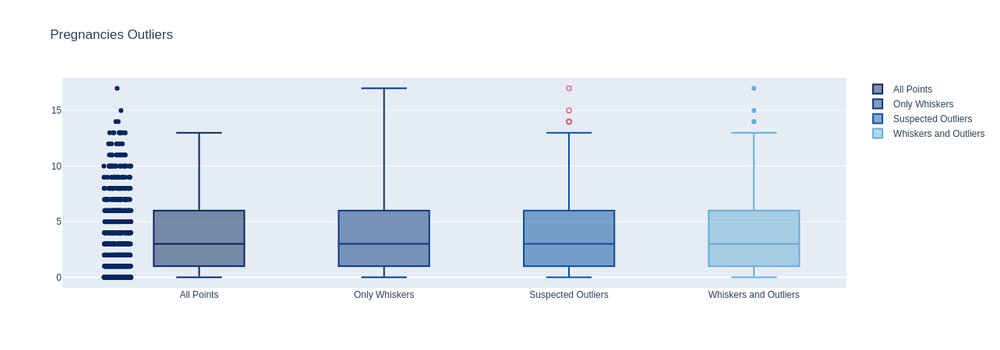

In [45]:


feature_number = 0
OutLiersBox(df,df_name[feature_number])



Number of outliers (inc duplicates): 4 and outliers: [15 17 14 14]
New dataset with removed outliers has 764 samples with 9 features each.


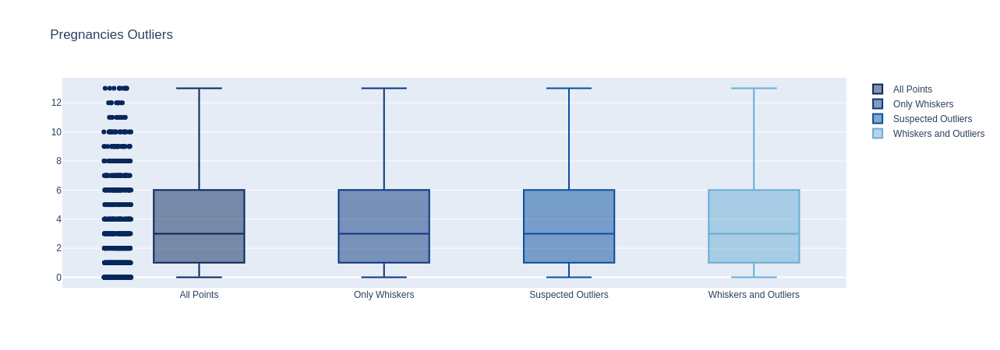

In [46]:
df_clean = TurkyOutliers(df_t,df_name[feature_number],True)
OutLiersBox(df_clean,df_name[feature_number])

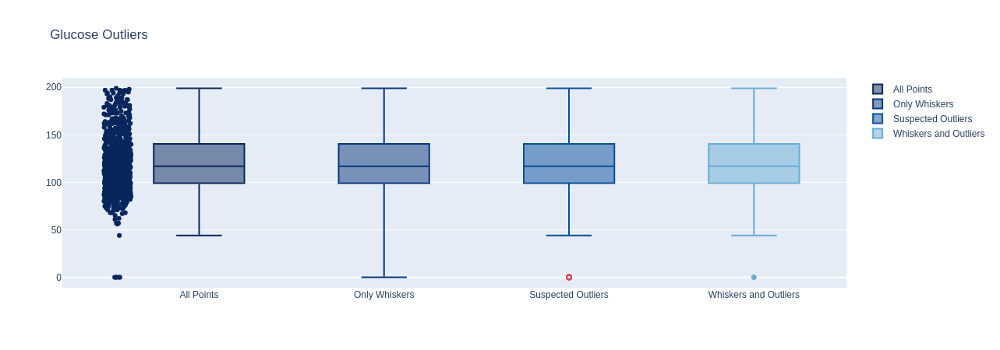

In [47]:
#Looks like a clean job here. Repeat for all faetures
feature_number = 1
OutLiersBox(df,df_name[feature_number])


Number of outliers (inc duplicates): 5 and outliers: [0 0 0 0 0]
New dataset with removed outliers has 759 samples with 9 features each.


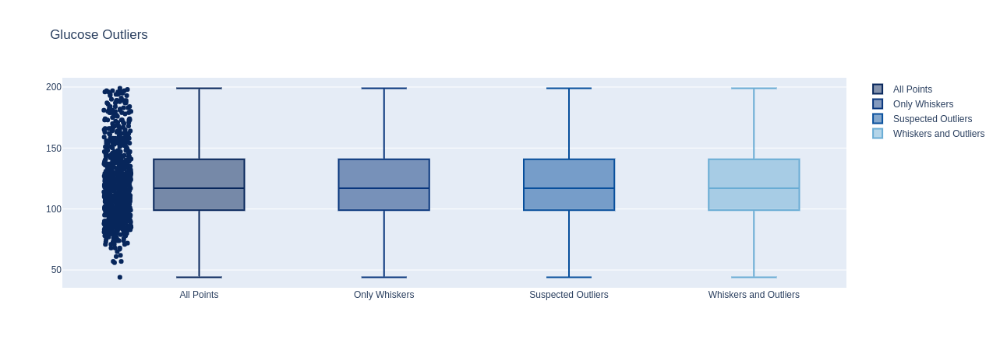

In [48]:
df_clean = TurkyOutliers(df_clean,df_name[feature_number],True)
OutLiersBox(df_clean,df_name[feature_number])

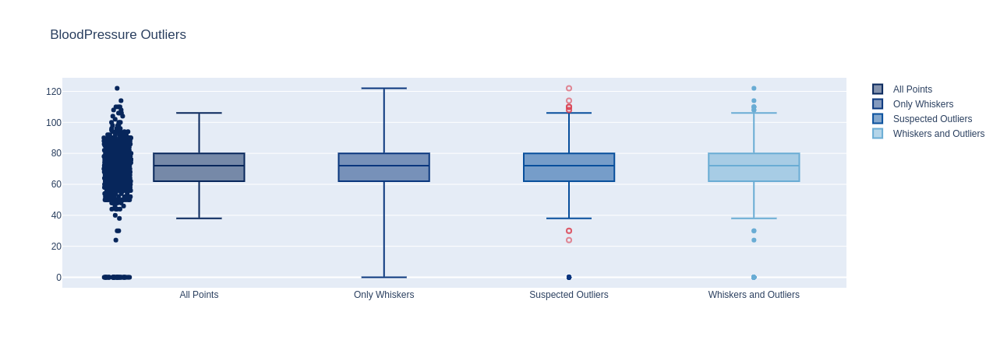

In [49]:
feature_number = 2
OutLiersBox(df,df_name[feature_number])

Number of outliers (inc duplicates): 45 and outliers: [  0   0  30 110   0   0   0   0 108 122  30   0 110   0   0   0   0   0
   0   0   0   0   0 108   0   0   0   0   0   0   0   0   0   0 110   0
  24   0   0   0   0 114   0   0   0]
New dataset with removed outliers has 714 samples with 9 features each.


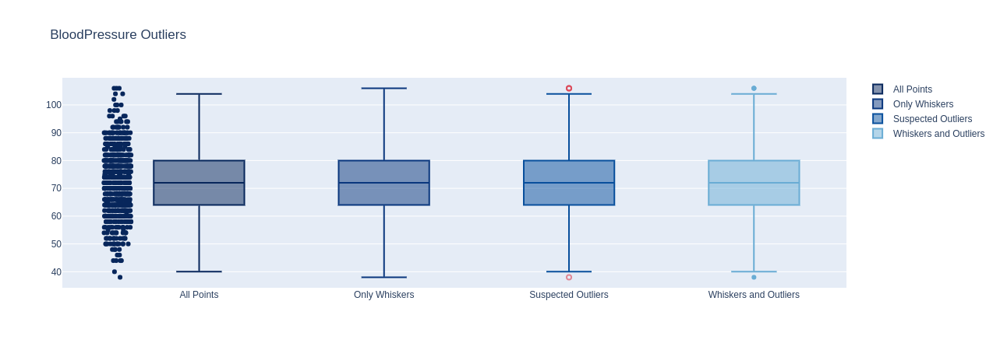

In [50]:
df_clean = TurkyOutliers(df_clean,df_name[feature_number],True)
OutLiersBox(df_clean,df_name[feature_number])

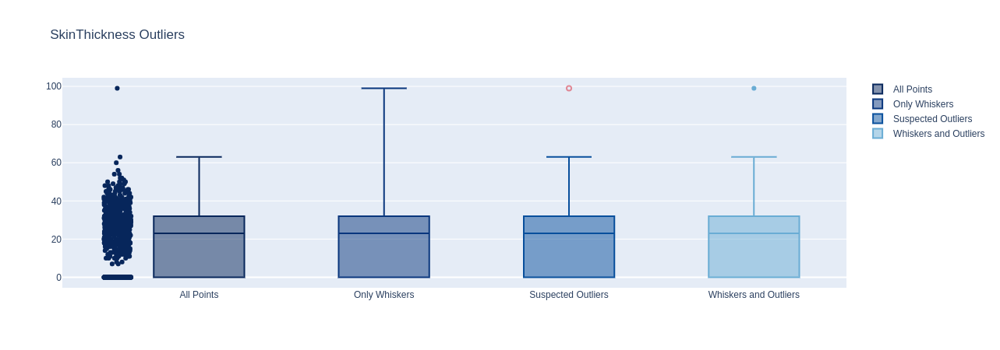

In [51]:
feature_number = 3
OutLiersBox(df,df_name[feature_number])

Number of outliers (inc duplicates): 1 and outliers: [99]
New dataset with removed outliers has 713 samples with 9 features each.


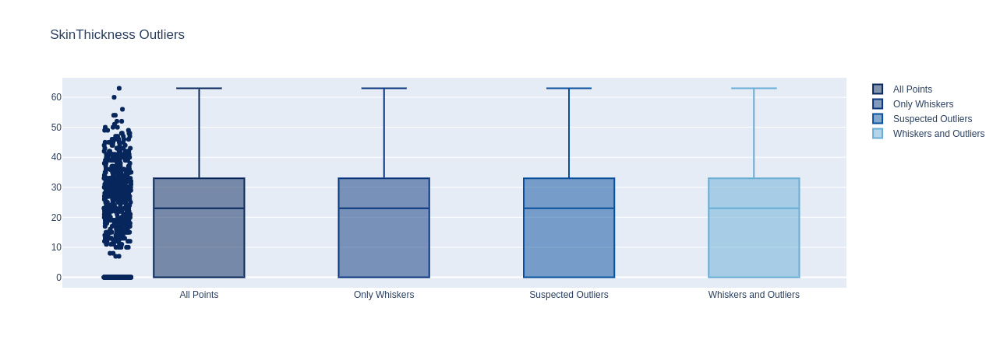

In [52]:
df_clean = TurkyOutliers(df_clean,df_name[feature_number],True)
OutLiersBox(df_clean,df_name[feature_number])

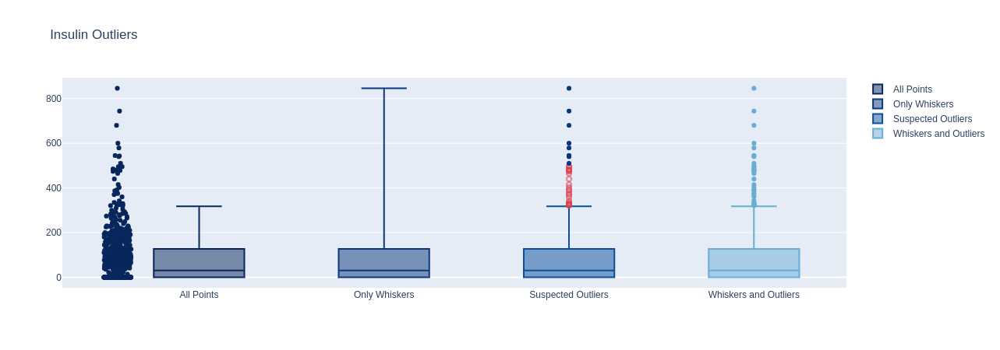

In [53]:
#Zero thickskin samples are very high?
feature_number = 4
OutLiersBox(df,df_name[feature_number])

Number of outliers (inc duplicates): 27 and outliers: [543 846 342 495 485 495 478 744 370 680 402 375 545 360 465 415 579 474
 480 600 440 540 480 335 387 392 510]
New dataset with removed outliers has 686 samples with 9 features each.


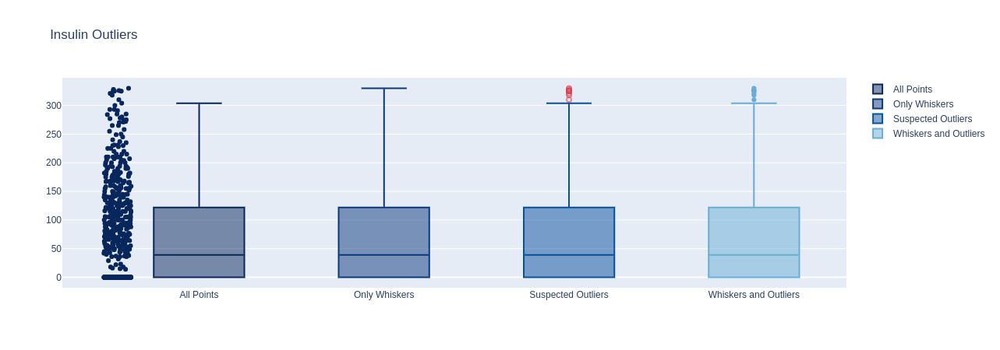

In [54]:
df_clean = TurkyOutliers(df_clean,df_name[4],True)
OutLiersBox(df_clean,df_name[4])

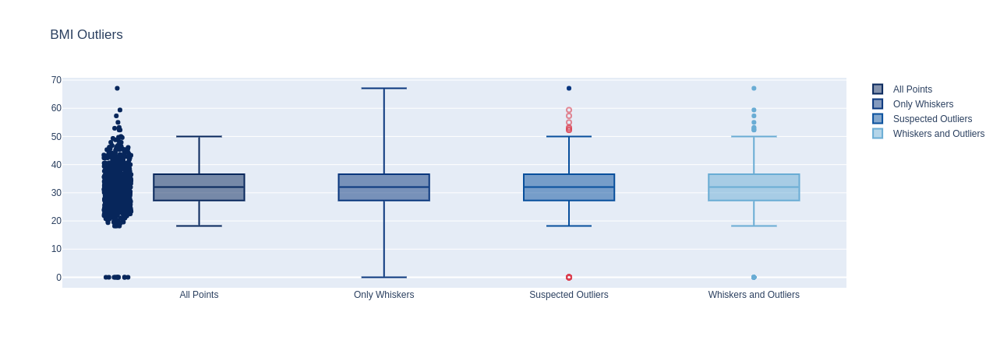

In [55]:
feature_number = 5
OutLiersBox(df,df_name[feature_number])

Number of outliers (inc duplicates): 10 and outliers: [ 0.  49.7 53.2  0.  50.  52.9  0.  59.4 57.3  0. ]
New dataset with removed outliers has 676 samples with 9 features each.


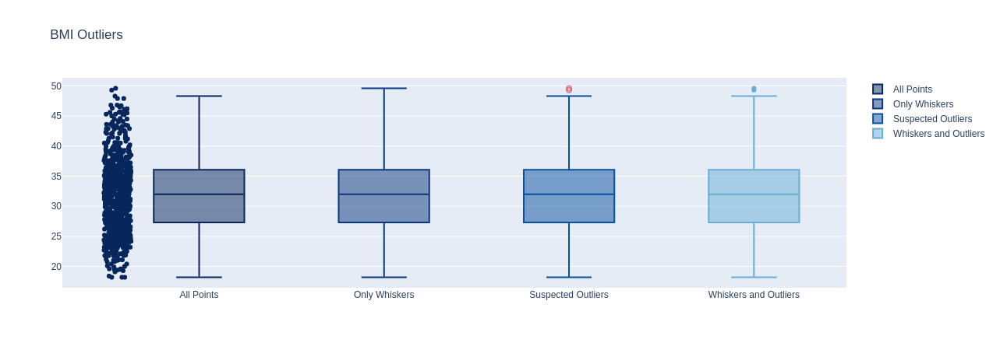

In [56]:
df_clean = TurkyOutliers(df_clean,df_name[feature_number],True)
OutLiersBox(df_clean,df_name[feature_number])

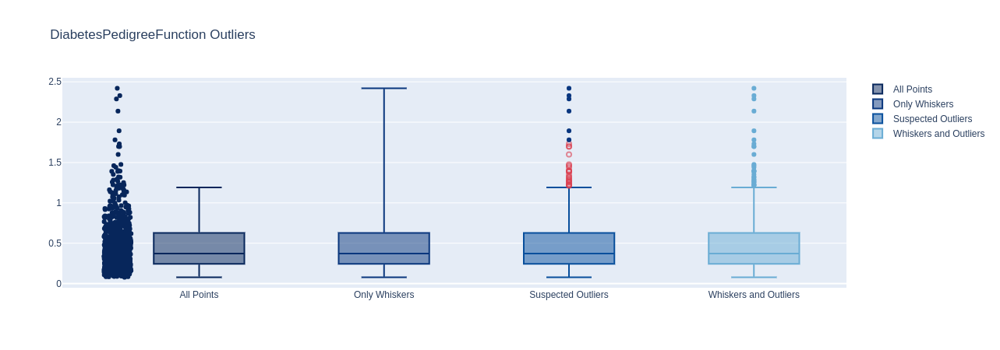

In [57]:
feature_number = 6
OutLiersBox(df,df_name[feature_number])

Number of outliers (inc duplicates): 29 and outliers: [2.288 1.441 1.39  1.893 1.781 1.222 1.4   1.189 1.321 1.224 1.318 1.213
 1.353 1.224 1.391 1.476 1.268 1.6   1.191 1.251 1.699 1.258 1.282 1.698
 1.461 1.292 1.394 1.174 1.182]
New dataset with removed outliers has 647 samples with 9 features each.


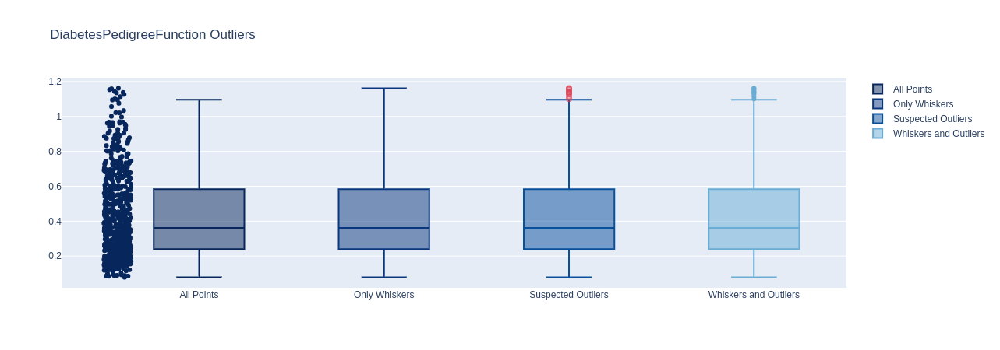

In [58]:
df_clean = TurkyOutliers(df_clean,df_name[feature_number],True)
OutLiersBox(df_clean,df_name[feature_number])

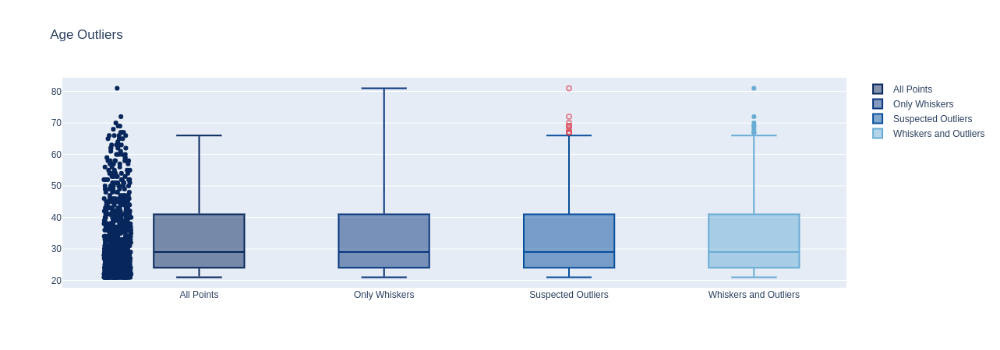

In [59]:
feature_number = 7
OutLiersBox(df,df_name[feature_number])

Number of outliers (inc duplicates): 11 and outliers: [69 66 67 81 67 66 67 66 70 68 66]
New dataset with removed outliers has 636 samples with 9 features each.


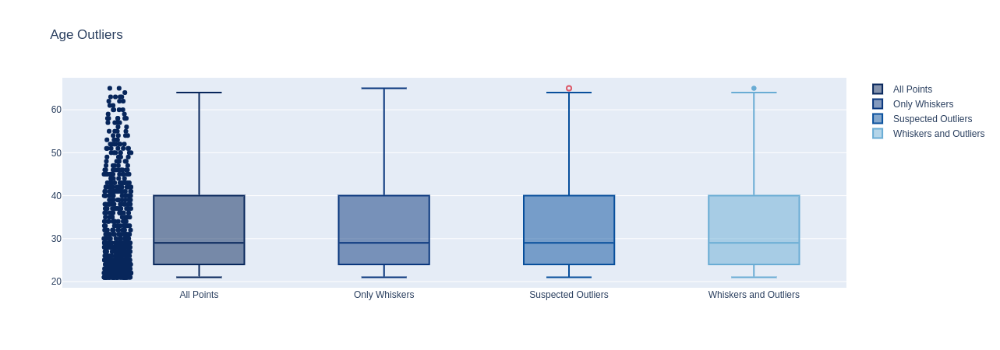

In [60]:
df_clean = TurkyOutliers(df_clean,df_name[feature_number],True)
OutLiersBox(df_clean,df_name[feature_number])

In [61]:
print('df shape: {}, new df shape: {}, we lost {} rows, {}% of our data'.format(df.shape[0],df_clean.shape[0],
                                                              df.shape[0]-df_clean.shape[0],
                                                        (df.shape[0]-df_clean.shape[0])/df.shape[0]*100))

df shape: 768, new df shape: 636, we lost 132 rows, 17.1875% of our data


One-Class SVM {-1: 197, 1: 571}
Robust covariance {-1: 77, 1: 691}
Isolation Forest {-1: 77, 1: 691}
Local Outlier Factor {-1: 76, 1: 692}


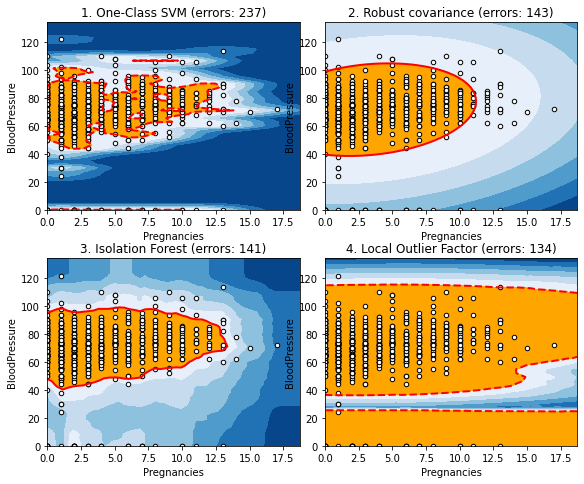

In [62]:
tt = OutLierDetection(df,'Pregnancies','BloodPressure',.1)

In [63]:
#Now lets create new datasets on these data and fit our models onto them 


df_clean_name = df_clean.columns
X_c =  df_clean[df_clean_name[0:8]]
Y_c = df_clean[df_clean_name[8]]
X_train_c, X_test_c, y_train_c, y_test_c =train_test_split(X_c,Y_c,
                                                   test_size=0.25,
                                                   random_state=0,
                                                   stratify=df_clean['Outcome'])



minmaxLR: 0.775798 mean result with std dev 0.040042
minmaxLDA: 0.782181 mean result with std dev 0.044073
minmaxKNN: 0.744105 mean result with std dev 0.062750
minmaxCART: 0.685727 mean result with std dev 0.077261
minmaxNB: 0.759131 mean result with std dev 0.047747
minmaxSVM: 0.763298 mean result with std dev 0.040902
minmaxAB: 0.712899 mean result with std dev 0.031326
minmaxGBM: 0.757004 mean result with std dev 0.044052
minmaxRF: 0.767465 mean result with std dev 0.055911
minmaxET: 0.767376 mean result with std dev 0.052026


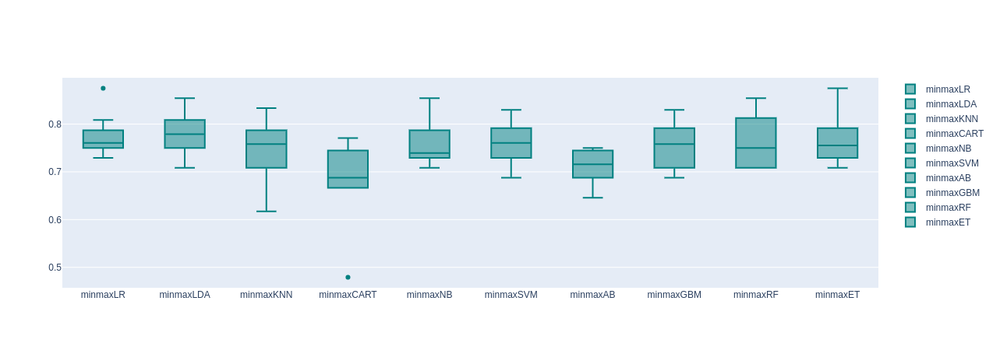

,Model,Score,Model,Score,Model,Score,Model,Score
0,LR,0.7569,standardLR,0.7622,minmaxLR,0.7621,minmaxLR,0.7758
1,LDA,0.7604,standardLDA,0.7604,minmaxLDA,0.7604,minmaxLDA,0.7822
2,KNN,0.6980,standardKNN,0.7136,minmaxKNN,0.7136,minmaxKNN,0.7441
3,CART,0.6944,standardCART,0.7064,minmaxCART,0.6962,minmaxCART,0.6857
4,NB,0.7431,standardNB,0.7431,minmaxNB,0.7431,minmaxNB,0.7591
5,SVM,0.7431,standardSVM,0.7552,minmaxSVM,0.7709,minmaxSVM,0.7633
6,AB,0.7552,standardAB,0.7552,minmaxAB,0.7552,minmaxAB,0.7129
7,GBM,0.7536,standardGBM,0.7501,minmaxGBM,0.7570,minmaxGBM,0.7570
8,RF,0.7310,standardRF,0.7484,minmaxRF,0.7501,minmaxRF,0.7675
9,ET,0.7413,standardET,0.7431,minmaxET,0.7466,minmaxET,0.7674


In [64]:
models = GetScaledModel('minmax')
names,results = BasedLine(X_train_c, y_train_c,models)
PlotBoxR().PlotResult(names,results)

scaledScoreMinMax_c = ScoreDataFrame(names,results)
compareModels = pd.concat([Prototype_score,
                           scaledScoreStandard,
                          scaledScoreMinMax,
                          scaledScoreMinMax_c], axis=1)
compareModels

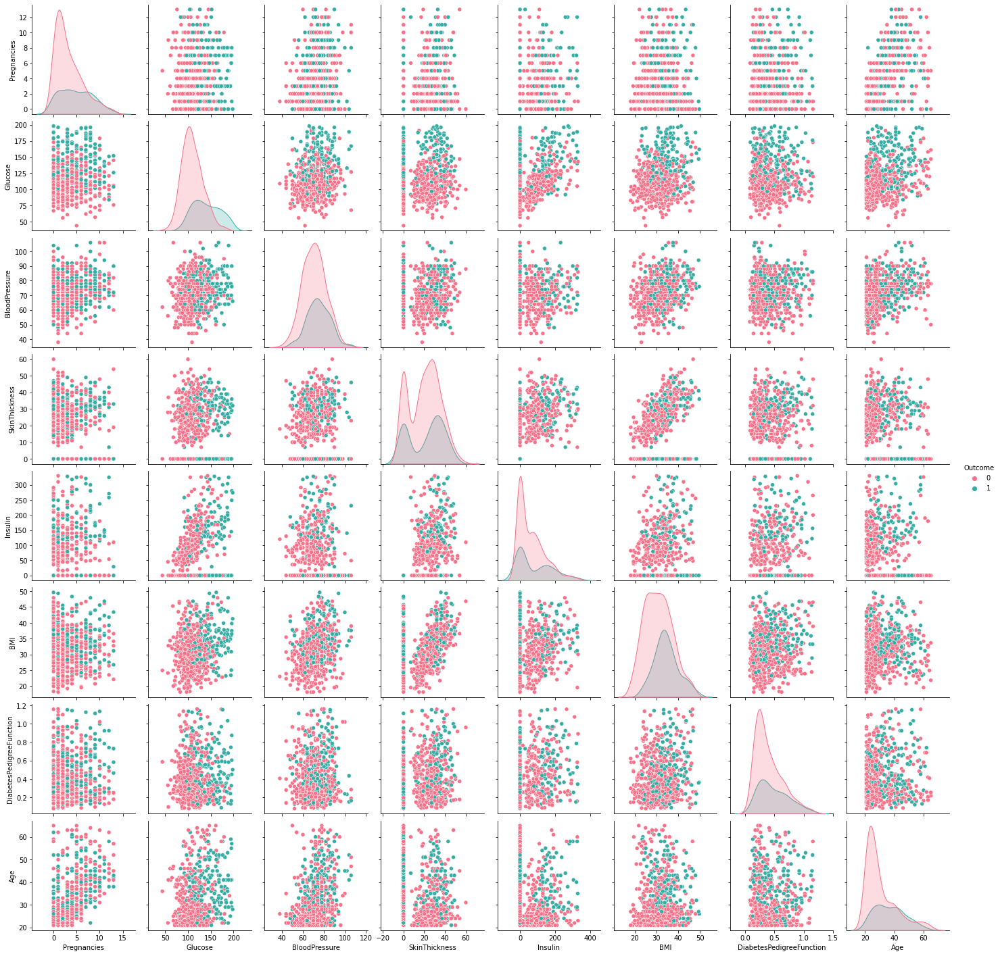

In [65]:
#Removing outliers improves some, but regressed others like SVM and AdaBoost and CART Why?
#However sans outliers LDA has highest score.

g = sns.pairplot(df_clean, hue = "Outcome", palette="husl")
#Any obsrvable change in pairplot below from before?

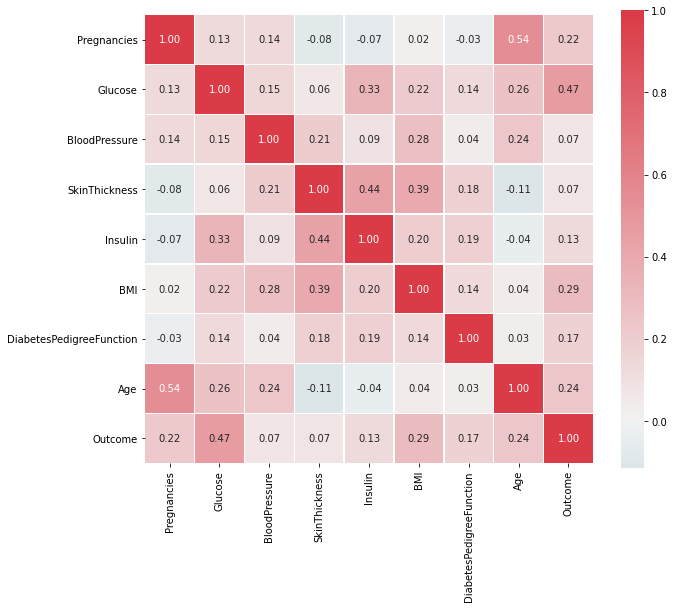

In [66]:
#Lets check if any two features have very high correlation. If there are, we can use only any one of them.  
def HeatMap(df,x=True):
        correlations = df.corr()
        ## Create color map ranging between two colors
        cmap = sns.diverging_palette(220, 10, as_cmap=True)
        fig, ax = plt.subplots(figsize=(10, 10))
        fig = sns.heatmap(correlations, cmap=cmap, vmax=1.0, center=0, fmt='.2f',square=True, linewidths=.5, annot=x, cbar_kws={"shrink": .75})
        fig.set_xticklabels(fig.get_xticklabels(), rotation = 90, fontsize = 10)
        fig.set_yticklabels(fig.get_yticklabels(), rotation = 0, fontsize = 10)
        plt.tight_layout()
        plt.show()

HeatMap(df,x=True)

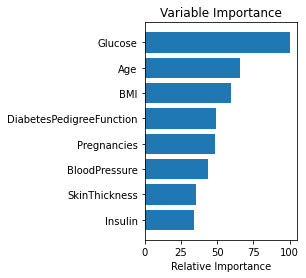

In [67]:
#nada

#Alternatively, we can use trees to ascertain which features are most important.
clf = ExtraTreesClassifier(n_estimators=250,
                              random_state=SEED)

clf.fit(X_train_c, y_train_c)

# #############################################################################
# Plot feature importance
feature_importance = clf.feature_importances_
# make importances relative to max importance
feature_importance = 100.0 * (feature_importance / feature_importance.max())
sorted_idx = np.argsort(feature_importance)
pos = np.arange(sorted_idx.shape[0]) + .5
plt.subplot(1, 2, 2)
plt.barh(pos, feature_importance[sorted_idx], align='center')
plt.yticks(pos, df.columns[sorted_idx])#boston.feature_names[sorted_idx])
plt.xlabel('Relative Importance')
plt.title('Variable Importance')
plt.show()


In [68]:
df_feature_imp=df_clean[['Glucose','Age','BMI','DiabetesPedigreeFunction','Outcome']]

In [69]:
df_feature_imp_name = df_feature_imp.columns


In [70]:


X =  df_feature_imp[df_feature_imp_name[0:df_feature_imp.shape[1]-1]]
Y = df_feature_imp[df_feature_imp_name[df_feature_imp.shape[1]-1]]
X_train_im, X_test_im, y_train_im, y_test_im =train_test_split(X,Y,
                                                   test_size=0.1,
                                                   random_state=0,
                                                   stratify=df_feature_imp['Outcome'])



minmaxLR: 0.783424 mean result with std dev 0.044573
minmaxLDA: 0.781670 mean result with std dev 0.043951
minmaxKNN: 0.757108 mean result with std dev 0.052171
minmaxCART: 0.687054 mean result with std dev 0.052823
minmaxNB: 0.781730 mean result with std dev 0.046205
minmaxSVM: 0.790260 mean result with std dev 0.034698
minmaxAB: 0.755414 mean result with std dev 0.041720
minmaxGBM: 0.755354 mean result with std dev 0.042918
minmaxRF: 0.760617 mean result with std dev 0.033141
minmaxET: 0.758863 mean result with std dev 0.037338


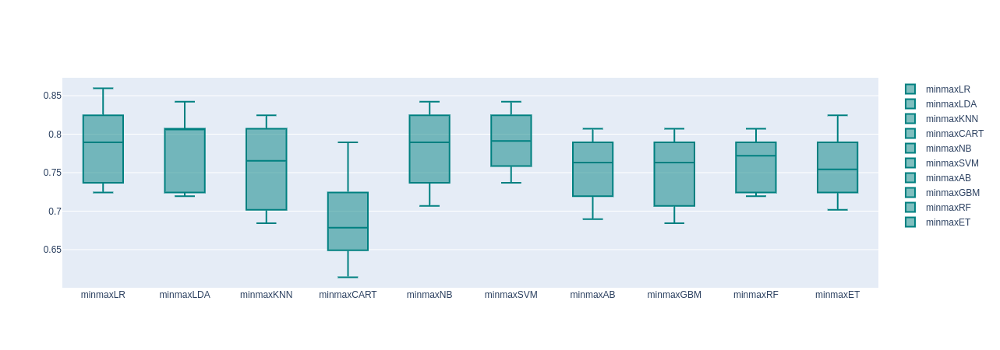

,Model,Score,Model,Score,Model,Score,Model,Score,Model,Score
0,LR,0.7569,standardLR,0.7622,minmaxLR,0.7621,minmaxLR,0.7758,minmaxLR,0.7834
1,LDA,0.7604,standardLDA,0.7604,minmaxLDA,0.7604,minmaxLDA,0.7822,minmaxLDA,0.7817
2,KNN,0.6980,standardKNN,0.7136,minmaxKNN,0.7136,minmaxKNN,0.7441,minmaxKNN,0.7571
3,CART,0.6944,standardCART,0.7064,minmaxCART,0.6962,minmaxCART,0.6857,minmaxCART,0.6871
4,NB,0.7431,standardNB,0.7431,minmaxNB,0.7431,minmaxNB,0.7591,minmaxNB,0.7817
5,SVM,0.7431,standardSVM,0.7552,minmaxSVM,0.7709,minmaxSVM,0.7633,minmaxSVM,0.7903
6,AB,0.7552,standardAB,0.7552,minmaxAB,0.7552,minmaxAB,0.7129,minmaxAB,0.7554
7,GBM,0.7536,standardGBM,0.7501,minmaxGBM,0.7570,minmaxGBM,0.7570,minmaxGBM,0.7554
8,RF,0.7310,standardRF,0.7484,minmaxRF,0.7501,minmaxRF,0.7675,minmaxRF,0.7606
9,ET,0.7413,standardET,0.7431,minmaxET,0.7466,minmaxET,0.7674,minmaxET,0.7589


In [71]:
models = GetScaledModel('minmax')
names,results = BasedLine(X_train_im, y_train_im,models)
PlotBoxR().PlotResult(names,results)

scaledScoreMinMax_im = ScoreDataFrame(names,results)
compareModels = pd.concat([Prototype_score,
                           scaledScoreStandard,
                          scaledScoreMinMax,
                          scaledScoreMinMax_c,
                          scaledScoreMinMax_im], axis=1)
compareModels

In [72]:
#Now we have to tune each model and hypertune them.
#To search in the hyperparameter space, we can use either grid search or a random search. 

df_unscaled = df_clean[['Glucose', 'BMI', 'Age', 'DiabetesPedigreeFunction', 'Outcome']]
df_imp_scaled_name = df_unscaled.columns





In [73]:
df_imp_scaled = MinMaxScaler().fit_transform(df_unscaled)
X =  df_imp_scaled[:,0:4]
Y =  df_imp_scaled[:,4]
X_train_sc, X_test_sc, y_train_sc, y_test_sc =train_test_split(X,Y,
                                                   test_size=0.1,
                                                   random_state=0,
                                                   stratify=df_imp_scaled[:,4])

In [74]:
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from scipy.stats import uniform

In [75]:
class RandomSearch(object):
    
    def __init__(self,X_train,y_train,model,hyperparameters):
        
        self.X_train = X_train
        self.y_train = y_train
        self.model = model
        self.hyperparameters = hyperparameters
        
    def RandomSearch(self):
        # Create randomized search 10-fold cross validation and 100 iterations
        cv = 10
        clf = RandomizedSearchCV(self.model,
                                 self.hyperparameters,
                                 random_state=1,
                                 n_iter=100,
                                 cv=cv,
                                 verbose=0,
                                 n_jobs=-1,
                                 )
        # Fit randomized search
        best_model = clf.fit(self.X_train, self.y_train)
        message = (best_model.best_score_, best_model.best_params_)
        print("Best: %f using %s" % (message))

        return best_model,best_model.best_params_
    
    def BestModelPridict(self,X_test):
        
        best_model,_ = self.RandomSearch()
        pred = best_model.predict(X_test)
        return pred

In [76]:
class GridSearch(object):
    
    def __init__(self,X_train,y_train,model,hyperparameters):
        
        self.X_train = X_train
        self.y_train = y_train
        self.model = model
        self.hyperparameters = hyperparameters
        
    def GridSearch(self):
        # Create randomized search 10-fold cross validation and 100 iterations
        cv = 10
        clf = GridSearchCV(self.model,
                                 self.hyperparameters,
                                 cv=cv,
                                 verbose=0,
                                 n_jobs=-1,
                                 )
        # Fit randomized search
        best_model = clf.fit(self.X_train, self.y_train)
        message = (best_model.best_score_, best_model.best_params_)
        print("Best: %f using %s" % (message))

        return best_model,best_model.best_params_
    
    def BestModelPridict(self,X_test):
        
        best_model,_ = self.GridSearch()
        pred = best_model.predict(X_test)
        return pred
    

In [77]:
#WHen to use which search? Ranndom for LR and grid for cart seems to be inituitive. 

model = LogisticRegression()

penalty  = ['l1', 'l2']

#This is hyperparameter distribution - 

C = uniform(loc=0, scale=4)
hyperparameters = dict(C=C, penalty=penalty)



In [78]:
LR_RandSearch = RandomSearch(X_train_sc, y_train_sc, model, hyperparameters)

Prediction_LR = LR_RandSearch.BestModelPridict(X_test_sc)

Best: 0.786903 using {'C': 3.730229437354635, 'penalty': 'l2'}


In [79]:
def floatingDecimals(f_val, dec=3):
    prc = "{:."+ str(dec) + "f}"
    
    return float(prc.format(f_val))

In [80]:
print('Prediction on test set is :' ,floatingDecimals((y_test_sc == Prediction_LR).mean(), 7))

Prediction on test set is : 0.828125


In [81]:


model_KNN = KNeighborsClassifier()

neighbors = [1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20]
param_grid = dict(n_neighbors=neighbors)



In [82]:
KNN_GridSearch = GridSearch(X_train_sc,y_train_sc,model_KNN,param_grid)
Prediction_KNN = KNN_GridSearch.BestModelPridict(X_test_sc)
print('prediction on test set is:' ,floatingDecimals((y_test_sc == Prediction_KNN).mean(),7))

Best: 0.809558 using {'n_neighbors': 15}
prediction on test set is: 0.828125


In [83]:
c_values = [0.1, 0.3, 0.5, 0.7, 0.9, 1.0, 1.3, 1.5, 1.7, 2.0]
kernel_values = [ 'linear' , 'poly' , 'rbf' , 'sigmoid' ]
param_grid = dict(C=c_values, kernel=kernel_values)
model_SVC = SVC()


In [84]:
SVC_GridSearch = GridSearch(X_train_sc,y_train_sc,model_SVC,param_grid)
Prediction_SVC = SVC_GridSearch.BestModelPridict(X_test_sc)
print('prediction on test set is:' ,floatingDecimals((y_test_sc == Prediction_SVC).mean(),7))

Best: 0.792075 using {'C': 0.1, 'kernel': 'poly'}
prediction on test set is: 0.84375


In [85]:


from scipy.stats import randint
max_depth_value = [3, None]
max_features_value =  randint(1, 4)
min_samples_leaf_value = randint(1, 4)
criterion_value = ["gini", "entropy"]



In [86]:
param_grid = dict(max_depth = max_depth_value,
                  max_features = max_features_value,
                  min_samples_leaf = min_samples_leaf_value,
                  criterion = criterion_value)

In [87]:
model_CART = DecisionTreeClassifier()
CART_RandSearch = RandomSearch(X_train_sc,y_train_sc,model_CART,param_grid)
Prediction_CART = CART_RandSearch.BestModelPridict(X_test_sc)
print('prediction on test set is:' ,floatingDecimals((y_test_sc == Prediction_CART).mean(),7))

Best: 0.767574 using {'criterion': 'gini', 'max_depth': 3, 'max_features': 3, 'min_samples_leaf': 1}
prediction on test set is: 0.78125


In [88]:


learning_rate_value = [.01,.05,.1,.5,1]
n_estimators_value = [50,100,150,200,250,300]

param_grid = dict(learning_rate=learning_rate_value, n_estimators=n_estimators_value)



In [89]:
model_Ad = AdaBoostClassifier()
Ad_GridSearch = GridSearch(X_train_sc,y_train_sc,model_Ad,param_grid)
Prediction_Ad = Ad_GridSearch.BestModelPridict(X_test_sc)
print('prediction on test set is:' ,floatingDecimals((y_test_sc == Prediction_Ad).mean(),7))


Best: 0.800817 using {'learning_rate': 0.05, 'n_estimators': 150}
prediction on test set is: 0.8125


In [90]:
learning_rate_value = [.01,.05,.1,.5,1]
n_estimators_value = [50,100,150,200,250,300]

param_grid = dict(learning_rate=learning_rate_value, n_estimators=n_estimators_value)

In [91]:
model_GB = GradientBoostingClassifier()
GB_GridSearch = GridSearch(X_train_sc,y_train_sc,model_GB,param_grid)
Prediction_GB = GB_GridSearch.BestModelPridict(X_test_sc)
print('prediction on test set is:' ,floatingDecimals((y_test_sc == Prediction_GB).mean(),7))

Best: 0.774622 using {'learning_rate': 0.01, 'n_estimators': 200}
prediction on test set is: 0.828125


In [92]:
#Need to finetune randomforest and extra trees later
#Ensembling - Voting and beyond voting

from sklearn.ensemble import VotingClassifier
param = {'C': 0.7678243129497218, 'penalty': 'l2'}
model1 = LogisticRegression(**param)

#Why not able to use l1?

param = {'n_neighbors': 15}
model2 = KNeighborsClassifier(**param)

param = {'C': 1.7, 'kernel': 'linear'}
model3 = SVC(**param)

param = {'criterion': 'gini', 'max_depth': 3, 'max_features': 2, 'min_samples_leaf': 3}
model4 = DecisionTreeClassifier(**param)

param = {'learning_rate': 0.05, 'n_estimators': 150}
model5 = AdaBoostClassifier(**param)

param = {'learning_rate': 0.01, 'n_estimators': 100}
model6 = GradientBoostingClassifier(**param)

model7 = GaussianNB()

model8 = RandomForestClassifier()

model9 = ExtraTreesClassifier()




In [93]:
# create the sub models
estimators = [('LR',model1), ('KNN',model2), ('SVC',model3),
              ('DT',model4), ('ADa',model5), ('GB',model6),
              ('NB',model7), ('RF',model8),  ('ET',model9)]

In [94]:


# create the ensemble model
kfold = StratifiedKFold(n_splits=10, random_state=SEED)
ensemble = VotingClassifier(estimators)
results = cross_val_score(ensemble, X_train_sc,y_train_sc, cv=kfold)
print('Accuracy on train: ',results.mean())
ensemble_model = ensemble.fit(X_train_sc,y_train_sc)
pred = ensemble_model.predict(X_test_sc)
print('Accuracy on test:' , (y_test_sc == pred).mean())



Accuracy on train:  0.7921355111917725
Accuracy on test: 0.8125


In [95]:
def get_models():
    """Generate a library of base learners."""
    param = {'C': 0.7678243129497218, 'penalty': 'l2'}
    model1 = LogisticRegression(**param)

    param = {'n_neighbors': 15}
    model2 = KNeighborsClassifier(**param)

    param = {'C': 1.7, 'kernel': 'linear', 'probability':True}
    model3 = SVC(**param)

    param = {'criterion': 'gini', 'max_depth': 3, 'max_features': 2, 'min_samples_leaf': 3}
    model4 = DecisionTreeClassifier(**param)

    param = {'learning_rate': 0.05, 'n_estimators': 150}
    model5 = AdaBoostClassifier(**param)

    param = {'learning_rate': 0.01, 'n_estimators': 100}
    model6 = GradientBoostingClassifier(**param)

    model7 = GaussianNB()

    model8 = RandomForestClassifier()

    model9 = ExtraTreesClassifier()

    models = {'LR':model1, 'KNN':model2, 'SVC':model3,
              'DT':model4, 'ADa':model5, 'GB':model6,
              'NB':model7, 'RF':model8,  'ET':model9
              }

    return models

In [96]:
def train_predict(model_list,xtrain, xtest, ytrain, ytest):
    """Fit models in list on training set and return preds"""
    P = np.zeros((ytest.shape[0], len(model_list)))
    P = pd.DataFrame(P)

    print("Fitting models.")
    cols = list()
    for i, (name, m) in enumerate(models.items()):
        print("%s..." % name, end=" ", flush=False)
        m.fit(xtrain, ytrain)
        P.iloc[:, i] = m.predict_proba(xtest)[:, 1]
        cols.append(name)
        print("done")

    P.columns = cols
    print("Done.\n")
    return P

In [97]:


models = get_models()
P = train_predict(models,X_train_sc,X_test_sc,y_train_sc,y_test_sc)


Fitting models.
LR... done
KNN... done
SVC... done
DT... done
ADa... done
GB... done
NB... done
RF... done
ET... done
Done.



In [98]:
from mlens.visualization import corrmat

[MLENS] backend: threading


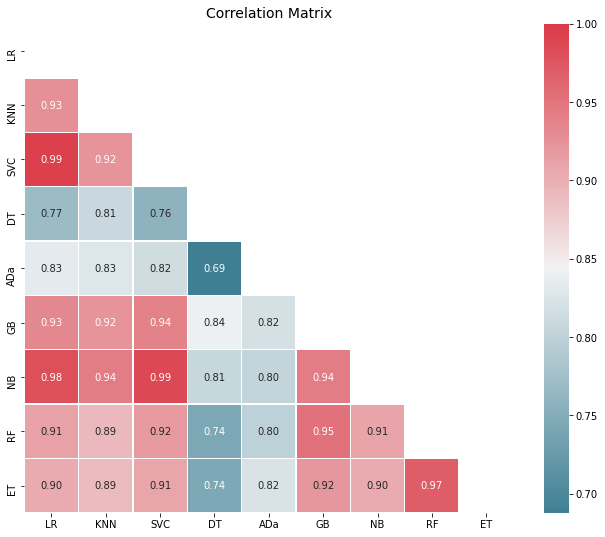

<AxesSubplot:title={'center':'Correlation Matrix'}>

In [99]:
corrmat(P.corr(), inflate=False)

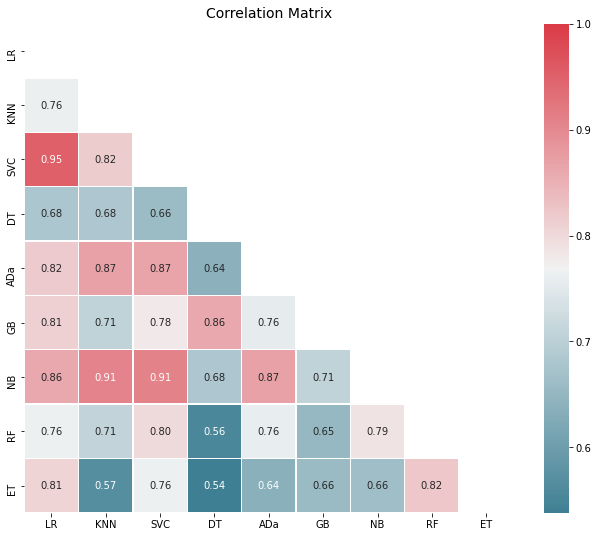

<AxesSubplot:title={'center':'Correlation Matrix'}>

In [100]:
corrmat(P.apply(lambda predic: 1*(predic >= 0.5) - y_test_sc).corr(), inflate=False)

In [101]:


base_learners = get_models()
meta_learner = GradientBoostingClassifier(
    n_estimators=1000,
    loss="exponential",
    max_features=6,
    max_depth=3,
    subsample=0.5,
    learning_rate=0.001, 
    random_state=SEED
)



In [102]:
from mlens.ensemble import SuperLearner

# Instantiate the ensemble with 10 folds
sl = SuperLearner(
    folds=10,
    random_state=SEED,
    verbose=2,
    backend="multiprocessing"
)

# Add the base learners and the meta learner
sl.add(list(base_learners.values()), proba=True) 
sl.add_meta(meta_learner, proba=True)

# Train the ensemble
sl.fit(X_train_sc, y_train_sc)

# Predict the test set
p_sl = sl.predict_proba(X_test_sc)


Fitting 2 layers
Processing layer-1             done | 00:00:06
Processing layer-2             done | 00:00:01
Fit complete                        | 00:00:08

Predicting 2 layers
Processing layer-1             done | 00:00:00
Processing layer-2             done | 00:00:00
Predict complete                    | 00:00:00


In [103]:
pp = []
for p in p_sl[:, 1]:
    if p>0.5:
        pp.append(1.)
    else:
        pp.append(0.)

In [104]:
print("\nSuper Learner Accuracy score: %.8f" % (y_test_sc== pp).mean())


Super Learner Accuracy score: 0.85937500
